#### TP2 Reconstruccion 3D

In [61]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [62]:
import glob, os
import numpy as np
import cv2
import cv2.aruco as aruco
import calib
from matplotlib import pyplot as plt 
import pickle

Calibracion estereo 

In [63]:
checkerboard_size = (5, 6)   # número de cuadrados en X y Y
square_size = 0.022           # metros
marker_size = 0.0165          # metros

dictionary = aruco.getPredefinedDictionary(aruco.DICT_6X6_250)
board_charuco = aruco.CharucoBoard(
    size=checkerboard_size,
    squareLength=square_size,
    markerLength=marker_size,
    dictionary=dictionary
)


In [64]:
directory = os.path.join("datospropios", "calib")
left_files_pattern = "*left*.jpg"
right_files_pattern = "*right*.jpg"

def numeric_sort(file_name):
    return int(file_name.split("_")[-1].split(".")[0])

left_file_names = sorted(
    glob.glob(
        os.path.join(directory, left_files_pattern)
    ),
    key=numeric_sort
)

right_file_names = sorted(
    glob.glob(
        os.path.join(directory, right_files_pattern)
    ),
    key=numeric_sort
)

num_left = len(left_file_names)
num_right = len(right_file_names)

In [65]:
image_size = None

world_points = []
left_images = []
right_images = []
left_images_points = []
right_images_points = []

for left_file_name, right_file_name in zip(left_file_names, right_file_names):

    print("processing", left_file_name, right_file_name)

    # leer imágenes en gris
    left_image = cv2.imread(left_file_name, cv2.IMREAD_GRAYSCALE)
    right_image = cv2.imread(right_file_name, cv2.IMREAD_GRAYSCALE)

    

    left_size = (left_image.shape[1], left_image.shape[0])
    right_size = (right_image.shape[1], right_image.shape[0])

    if left_size != right_size:
        raise Exception(f"left and right images sizes differ: {left_size} / {right_size}")
        
    if image_size is None:
        image_size = left_size
    else:
        if image_size != left_size:
            raise Exception(f"there are images with different sizes: {image_size} vs {left_size}")

    # --- Detectar marcadores ArUco ---
    # detectar markers
    corners_left, ids_left, _ = aruco.detectMarkers(left_image, dictionary)
    corners_right, ids_right, _ = aruco.detectMarkers(right_image, dictionary)

    # interpolar esquinas Charuco
    retval_left, charuco_corners_left, charuco_ids_left = aruco.interpolateCornersCharuco(
        markerCorners=corners_left,
        markerIds=ids_left,
        image=left_image,
        board=board_charuco
    )
    retval_right, charuco_corners_right, charuco_ids_right = aruco.interpolateCornersCharuco(
        markerCorners=corners_right,
        markerIds=ids_right,
        image=right_image,
        board=board_charuco
    )

    # chequear que se hayan detectado suficientes corners
    if charuco_corners_left is None or charuco_corners_right is None or len(charuco_corners_left) < 4:
        print("warning, not enough charuco corners")
        continue


    # Guardar imágenes
    left_images.append(left_image)
    right_images.append(right_image)

    # Guardar los corners detectados
    left_images_points.append(charuco_corners_left)
    right_images_points.append(charuco_corners_right)

    # Guardar puntos del mundo correspondientes
    # CÓDIGO CORREGIDO (USA EL MÉTODO getChessboardCorners())
    # Obtener las coordenadas 3D de todas las esquinas Charuco
    all_world_corners = board_charuco.getChessboardCorners()

    # Guardar puntos del mundo correspondientes
    world_pts_left = all_world_corners[charuco_ids_left.flatten()]
    world_pts_right = all_world_corners[charuco_ids_right.flatten()]

    # Para stereoCalibrate necesitamos que left y right tengan los mismos world points
    # Tomamos la intersección de IDs presentes en ambas imágenes
    common_ids, left_idx, right_idx = np.intersect1d(
        charuco_ids_left.flatten(),
        charuco_ids_right.flatten(),
        return_indices=True
    )

    # ... (código hasta el chequeo de common_ids) ...

    if len(common_ids) < 4:
        print("warning, not enough common corners between left and right")
        continue

    # --- CORRECCIÓN FINAL APLICADA AQUÍ ---
    # Usamos la variable 'all_world_corners' (que se definió correctamente antes)
    world_points.append(all_world_corners[common_ids])
    
    # El resto del código está bien
    left_images_points[-1] = charuco_corners_left[left_idx]
    right_images_points[-1] = charuco_corners_right[right_idx]

processing datospropios\calib\left_1.jpg datospropios\calib\right_1.jpg
processing datospropios\calib\left_2.jpg datospropios\calib\right_2.jpg
processing datospropios\calib\left_3.jpg datospropios\calib\right_3.jpg
processing datospropios\calib\left_4.jpg datospropios\calib\right_4.jpg
processing datospropios\calib\left_5.jpg datospropios\calib\right_5.jpg
processing datospropios\calib\left_6.jpg datospropios\calib\right_6.jpg
processing datospropios\calib\left_7.jpg datospropios\calib\right_7.jpg
processing datospropios\calib\left_8.jpg datospropios\calib\right_8.jpg
processing datospropios\calib\left_9.jpg datospropios\calib\right_9.jpg
processing datospropios\calib\left_10.jpg datospropios\calib\right_10.jpg
processing datospropios\calib\left_11.jpg datospropios\calib\right_11.jpg
processing datospropios\calib\left_12.jpg datospropios\calib\right_12.jpg
processing datospropios\calib\left_13.jpg datospropios\calib\right_13.jpg
processing datospropios\calib\left_14.jpg datospropios\c

processing datospropios\calib\left_1.jpg and datospropios\calib\right_1.jpg
--- Visualizando Detección para datospropios\calib\left_1.jpg ---


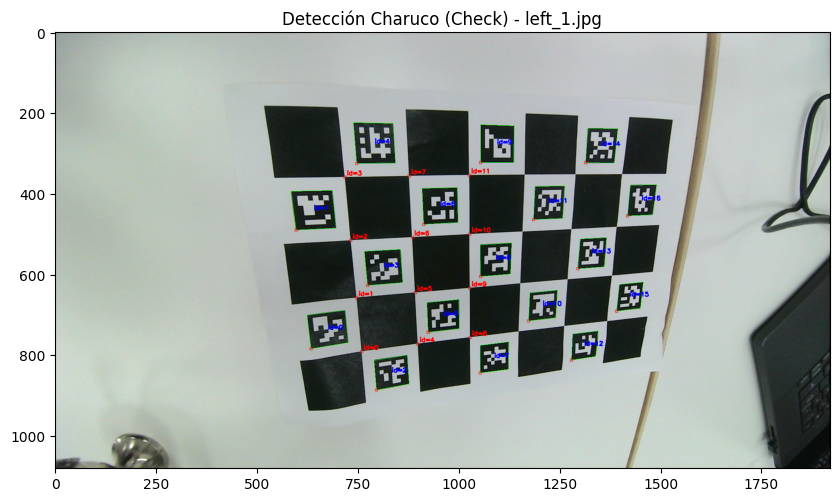

processing datospropios\calib\left_2.jpg and datospropios\calib\right_2.jpg
processing datospropios\calib\left_3.jpg and datospropios\calib\right_3.jpg
processing datospropios\calib\left_4.jpg and datospropios\calib\right_4.jpg
processing datospropios\calib\left_5.jpg and datospropios\calib\right_5.jpg
processing datospropios\calib\left_6.jpg and datospropios\calib\right_6.jpg
--- Visualizando Detección para datospropios\calib\left_6.jpg ---


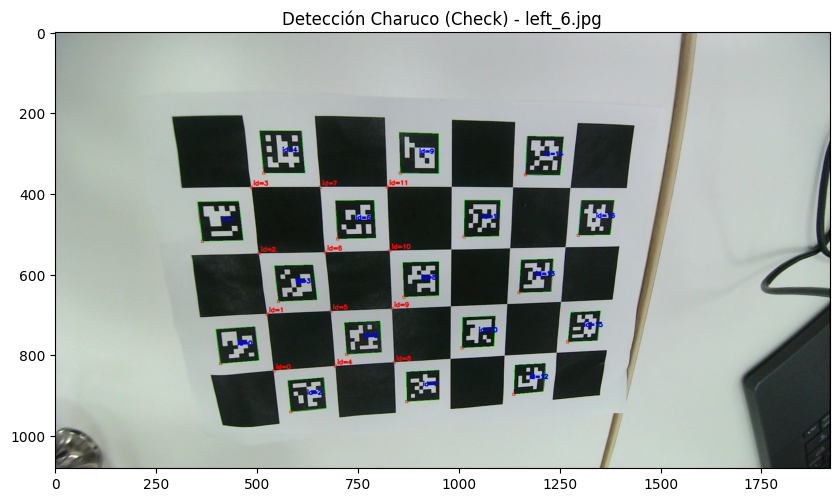

processing datospropios\calib\left_7.jpg and datospropios\calib\right_7.jpg
processing datospropios\calib\left_8.jpg and datospropios\calib\right_8.jpg
processing datospropios\calib\left_9.jpg and datospropios\calib\right_9.jpg
processing datospropios\calib\left_10.jpg and datospropios\calib\right_10.jpg
processing datospropios\calib\left_11.jpg and datospropios\calib\right_11.jpg
--- Visualizando Detección para datospropios\calib\left_11.jpg ---


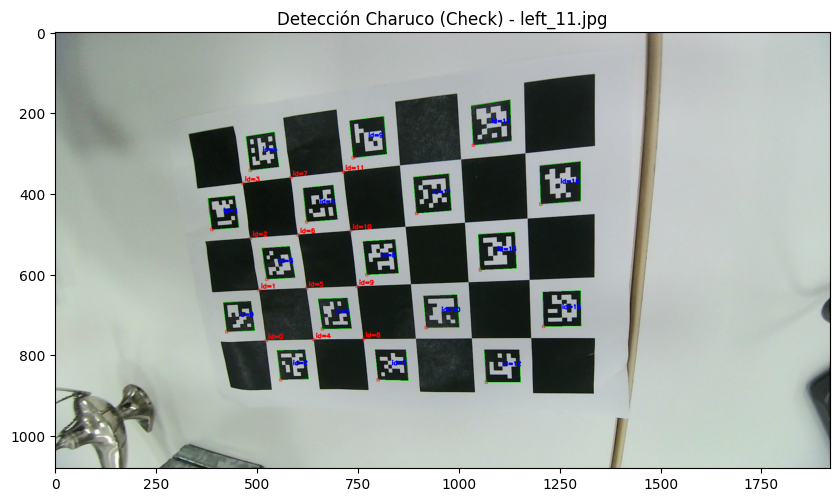

processing datospropios\calib\left_12.jpg and datospropios\calib\right_12.jpg
processing datospropios\calib\left_13.jpg and datospropios\calib\right_13.jpg
processing datospropios\calib\left_14.jpg and datospropios\calib\right_14.jpg
processing datospropios\calib\left_15.jpg and datospropios\calib\right_15.jpg
processing datospropios\calib\left_16.jpg and datospropios\calib\right_16.jpg
--- Visualizando Detección para datospropios\calib\left_16.jpg ---


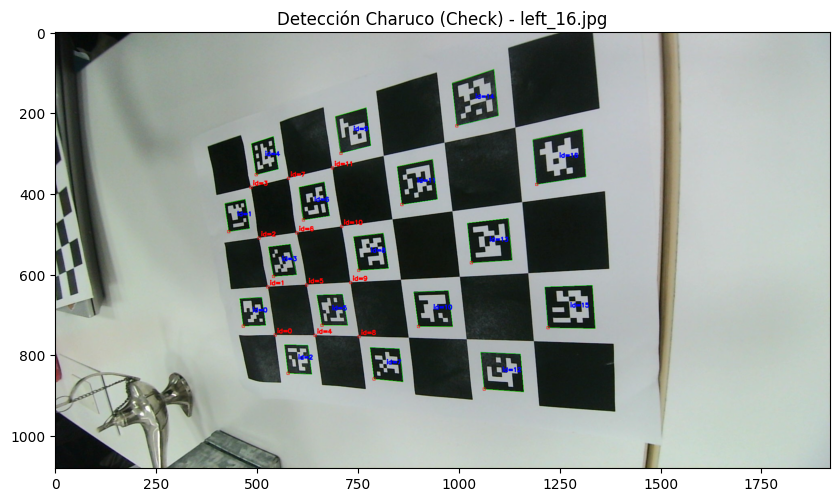

processing datospropios\calib\left_17.jpg and datospropios\calib\right_17.jpg
processing datospropios\calib\left_18.jpg and datospropios\calib\right_18.jpg
processing datospropios\calib\left_19.jpg and datospropios\calib\right_19.jpg
processing datospropios\calib\left_20.jpg and datospropios\calib\right_20.jpg
processing datospropios\calib\left_21.jpg and datospropios\calib\right_21.jpg
--- Visualizando Detección para datospropios\calib\left_21.jpg ---


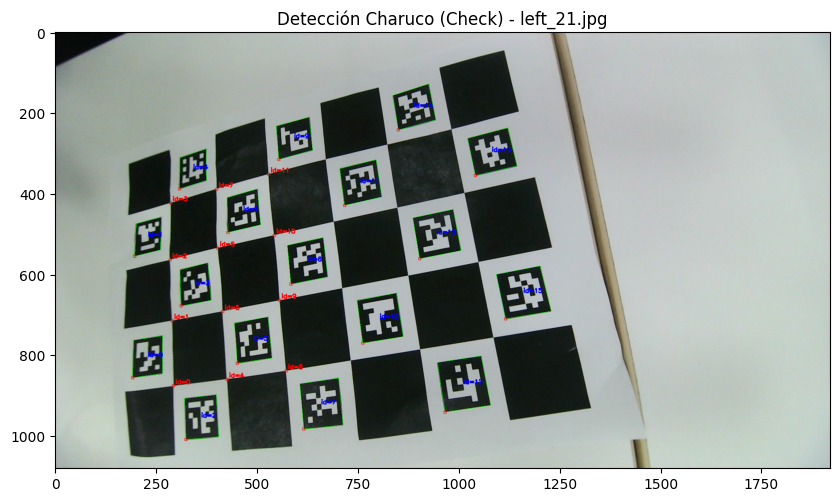

processing datospropios\calib\left_22.jpg and datospropios\calib\right_22.jpg
processing datospropios\calib\left_23.jpg and datospropios\calib\right_23.jpg
processing datospropios\calib\left_24.jpg and datospropios\calib\right_24.jpg
processing datospropios\calib\left_25.jpg and datospropios\calib\right_25.jpg
processing datospropios\calib\left_26.jpg and datospropios\calib\right_26.jpg
--- Visualizando Detección para datospropios\calib\left_26.jpg ---


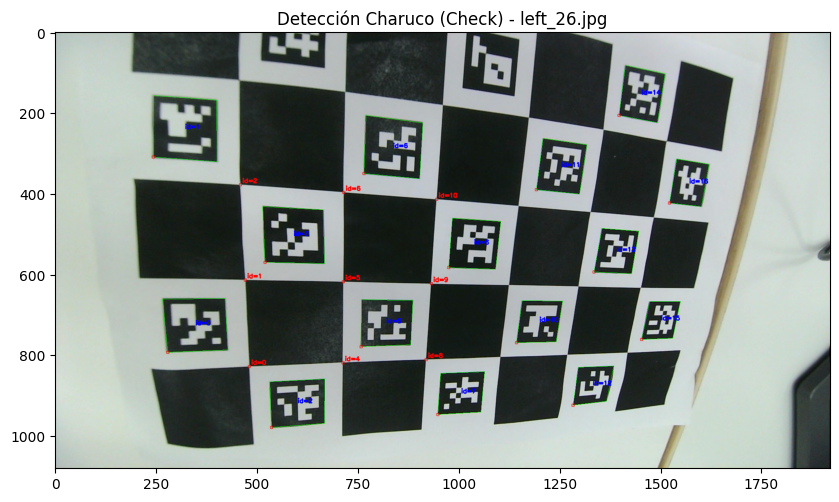

processing datospropios\calib\left_27.jpg and datospropios\calib\right_27.jpg
processing datospropios\calib\left_28.jpg and datospropios\calib\right_28.jpg
processing datospropios\calib\left_29.jpg and datospropios\calib\right_29.jpg
processing datospropios\calib\left_30.jpg and datospropios\calib\right_30.jpg
processing datospropios\calib\left_31.jpg and datospropios\calib\right_31.jpg
--- Visualizando Detección para datospropios\calib\left_31.jpg ---


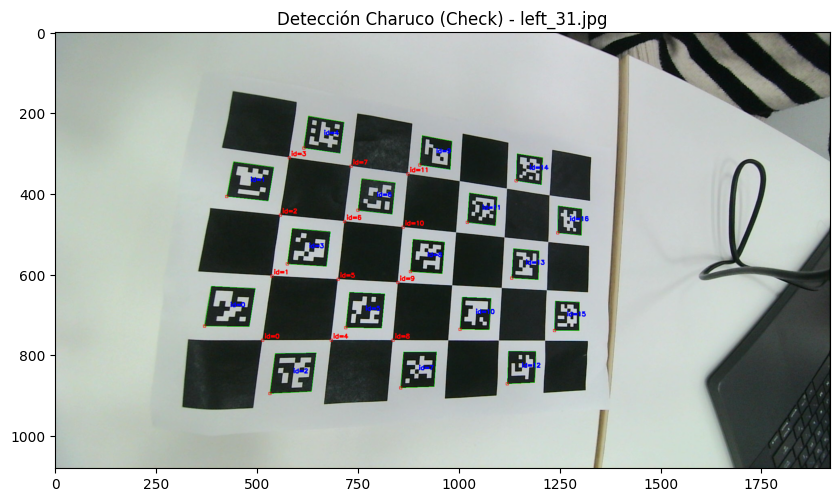

processing datospropios\calib\left_32.jpg and datospropios\calib\right_32.jpg
processing datospropios\calib\left_33.jpg and datospropios\calib\right_33.jpg
processing datospropios\calib\left_34.jpg and datospropios\calib\right_34.jpg
processing datospropios\calib\left_35.jpg and datospropios\calib\right_35.jpg
processing datospropios\calib\left_36.jpg and datospropios\calib\right_36.jpg
--- Visualizando Detección para datospropios\calib\left_36.jpg ---


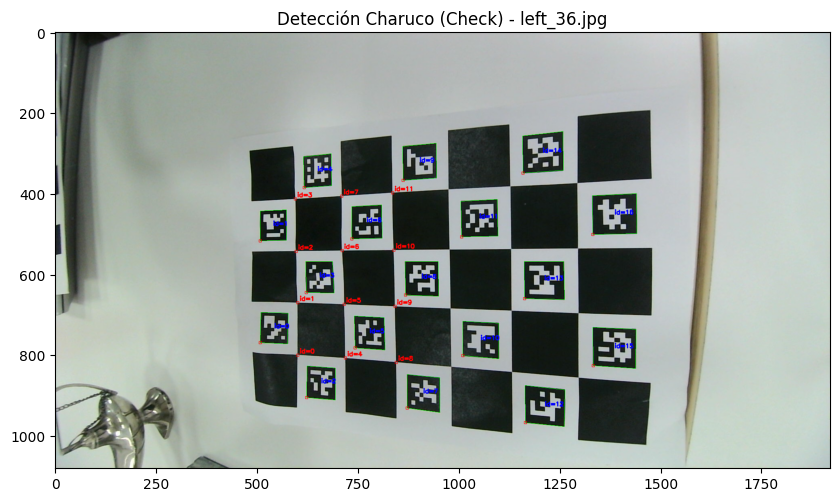

processing datospropios\calib\left_37.jpg and datospropios\calib\right_37.jpg
processing datospropios\calib\left_38.jpg and datospropios\calib\right_38.jpg
processing datospropios\calib\left_39.jpg and datospropios\calib\right_39.jpg
processing datospropios\calib\left_40.jpg and datospropios\calib\right_40.jpg
processing datospropios\calib\left_41.jpg and datospropios\calib\right_41.jpg
--- Visualizando Detección para datospropios\calib\left_41.jpg ---


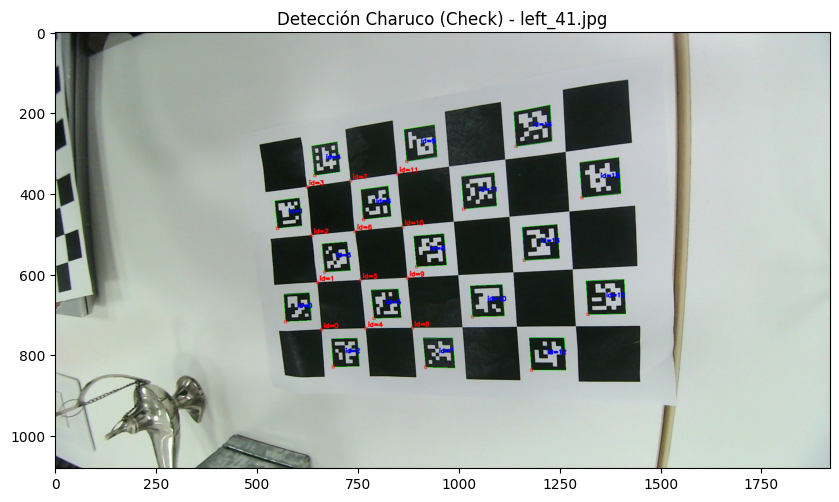

processing datospropios\calib\left_42.jpg and datospropios\calib\right_42.jpg
processing datospropios\calib\left_43.jpg and datospropios\calib\right_43.jpg
processing datospropios\calib\left_44.jpg and datospropios\calib\right_44.jpg
processing datospropios\calib\left_45.jpg and datospropios\calib\right_45.jpg
processing datospropios\calib\left_46.jpg and datospropios\calib\right_46.jpg
--- Visualizando Detección para datospropios\calib\left_46.jpg ---


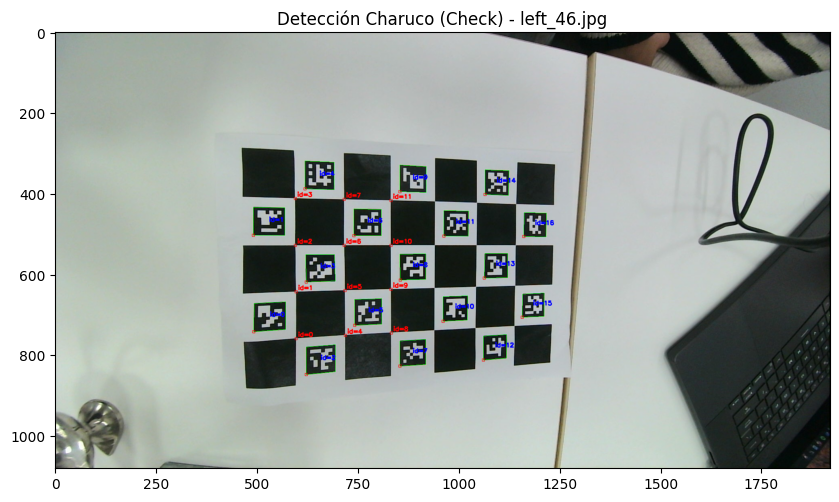

processing datospropios\calib\left_47.jpg and datospropios\calib\right_47.jpg
processing datospropios\calib\left_48.jpg and datospropios\calib\right_48.jpg
processing datospropios\calib\left_49.jpg and datospropios\calib\right_49.jpg
processing datospropios\calib\left_50.jpg and datospropios\calib\right_50.jpg
processing datospropios\calib\left_51.jpg and datospropios\calib\right_51.jpg
--- Visualizando Detección para datospropios\calib\left_51.jpg ---


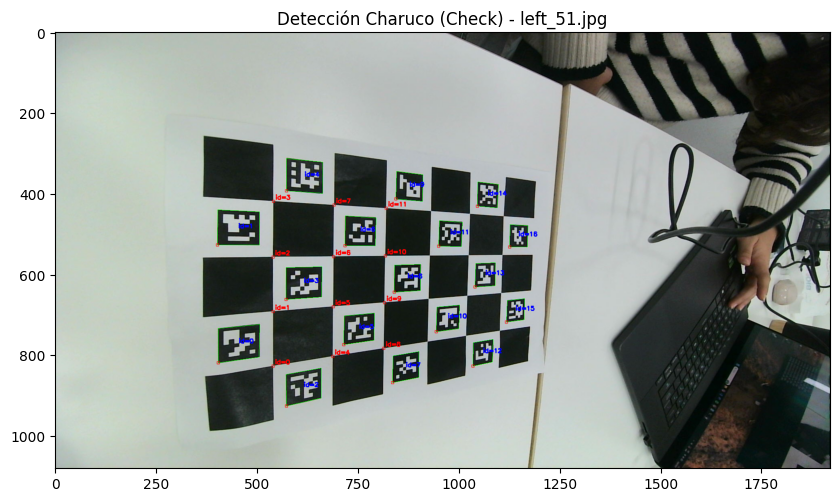

processing datospropios\calib\left_52.jpg and datospropios\calib\right_52.jpg
processing datospropios\calib\left_53.jpg and datospropios\calib\right_53.jpg
processing datospropios\calib\left_54.jpg and datospropios\calib\right_54.jpg
processing datospropios\calib\left_55.jpg and datospropios\calib\right_55.jpg
processing datospropios\calib\left_56.jpg and datospropios\calib\right_56.jpg
--- Visualizando Detección para datospropios\calib\left_56.jpg ---


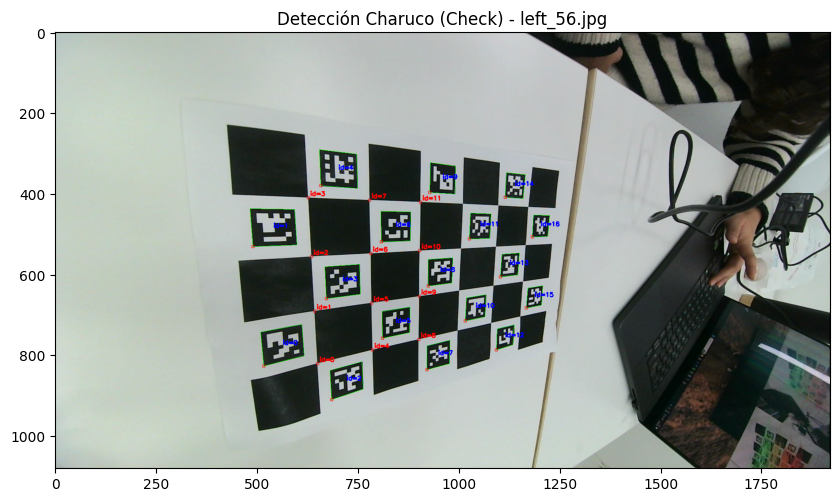

processing datospropios\calib\left_57.jpg and datospropios\calib\right_57.jpg
processing datospropios\calib\left_58.jpg and datospropios\calib\right_58.jpg
processing datospropios\calib\left_59.jpg and datospropios\calib\right_59.jpg
processing datospropios\calib\left_60.jpg and datospropios\calib\right_60.jpg
processing datospropios\calib\left_61.jpg and datospropios\calib\right_61.jpg
--- Visualizando Detección para datospropios\calib\left_61.jpg ---


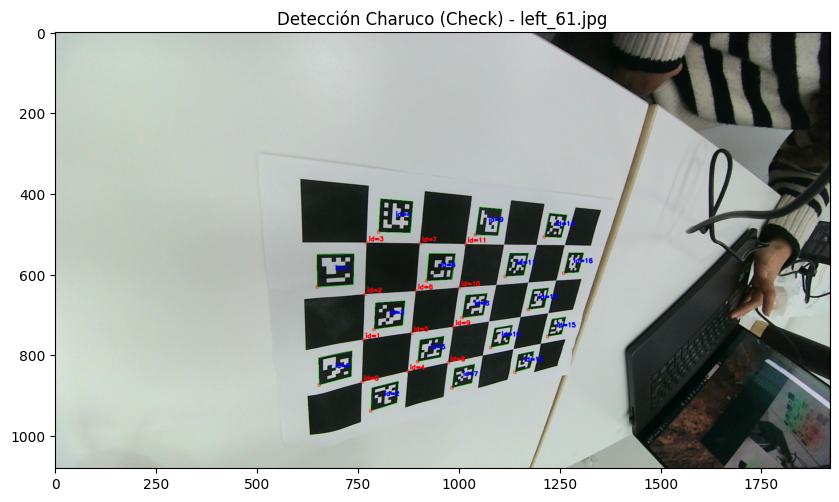

processing datospropios\calib\left_62.jpg and datospropios\calib\right_62.jpg
processing datospropios\calib\left_63.jpg and datospropios\calib\right_63.jpg
processing datospropios\calib\left_64.jpg and datospropios\calib\right_64.jpg
processing datospropios\calib\left_65.jpg and datospropios\calib\right_65.jpg
processing datospropios\calib\left_66.jpg and datospropios\calib\right_66.jpg
--- Visualizando Detección para datospropios\calib\left_66.jpg ---


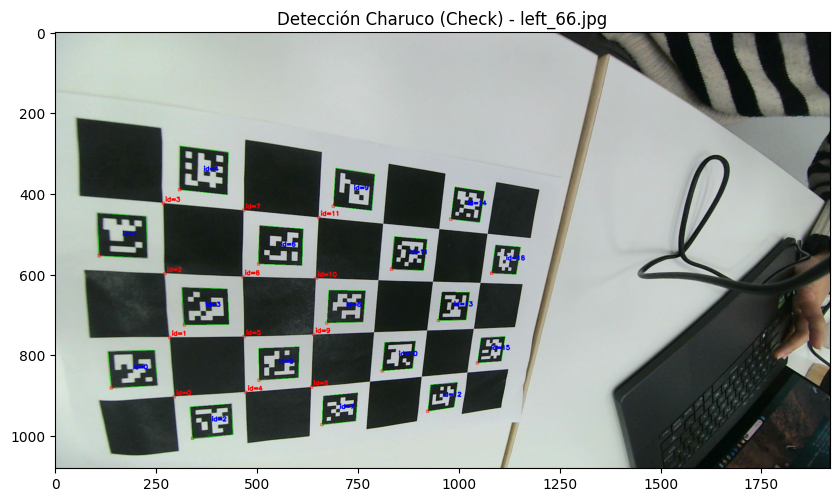

processing datospropios\calib\left_67.jpg and datospropios\calib\right_67.jpg
processing datospropios\calib\left_68.jpg and datospropios\calib\right_68.jpg
processing datospropios\calib\left_69.jpg and datospropios\calib\right_69.jpg
processing datospropios\calib\left_70.jpg and datospropios\calib\right_70.jpg
processing datospropios\calib\left_71.jpg and datospropios\calib\right_71.jpg
--- Visualizando Detección para datospropios\calib\left_71.jpg ---


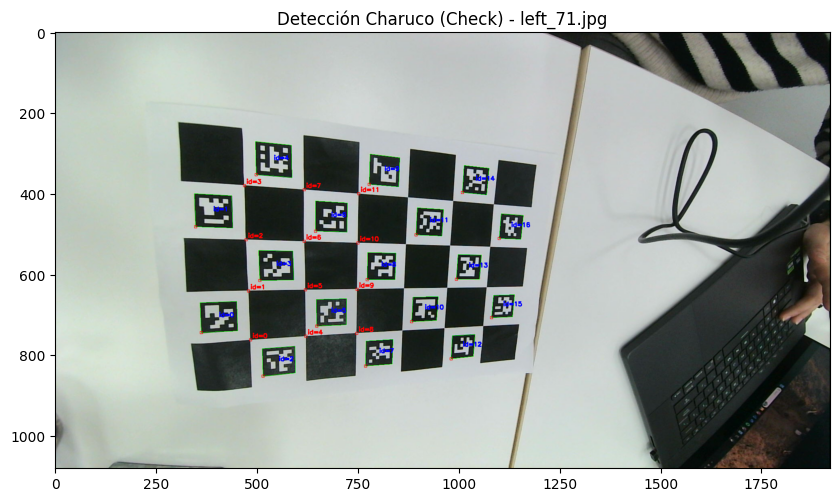

processing datospropios\calib\left_72.jpg and datospropios\calib\right_72.jpg
processing datospropios\calib\left_73.jpg and datospropios\calib\right_73.jpg
processing datospropios\calib\left_74.jpg and datospropios\calib\right_74.jpg
processing datospropios\calib\left_75.jpg and datospropios\calib\right_75.jpg
processing datospropios\calib\left_76.jpg and datospropios\calib\right_76.jpg
--- Visualizando Detección para datospropios\calib\left_76.jpg ---


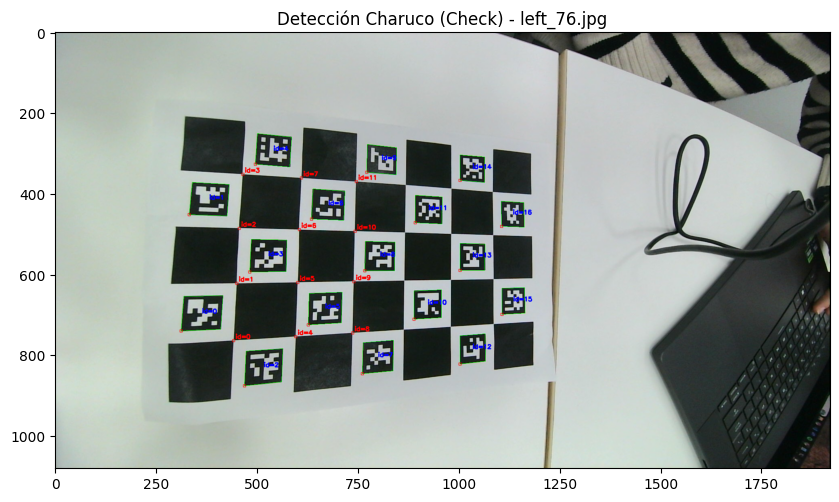

processing datospropios\calib\left_77.jpg and datospropios\calib\right_77.jpg
processing datospropios\calib\left_78.jpg and datospropios\calib\right_78.jpg
processing datospropios\calib\left_79.jpg and datospropios\calib\right_79.jpg
processing datospropios\calib\left_80.jpg and datospropios\calib\right_80.jpg
processing datospropios\calib\left_81.jpg and datospropios\calib\right_81.jpg
--- Visualizando Detección para datospropios\calib\left_81.jpg ---


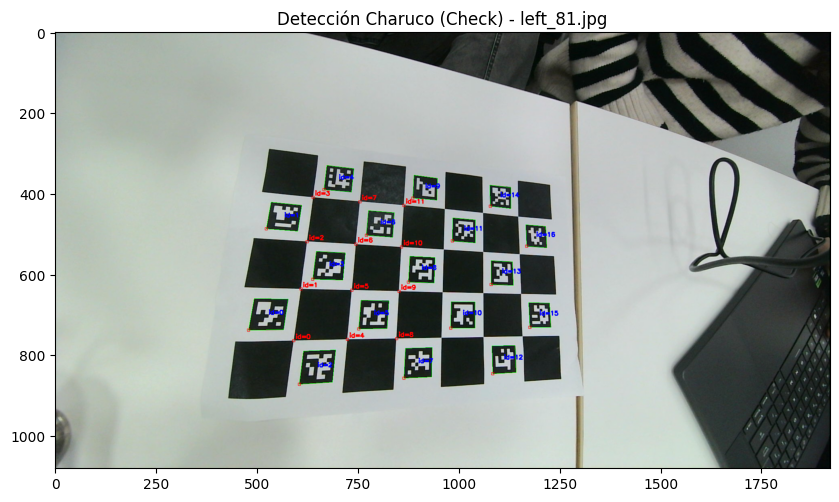

processing datospropios\calib\left_82.jpg and datospropios\calib\right_82.jpg
processing datospropios\calib\left_83.jpg and datospropios\calib\right_83.jpg
processing datospropios\calib\left_84.jpg and datospropios\calib\right_84.jpg
processing datospropios\calib\left_85.jpg and datospropios\calib\right_85.jpg
processing datospropios\calib\left_86.jpg and datospropios\calib\right_86.jpg
--- Visualizando Detección para datospropios\calib\left_86.jpg ---


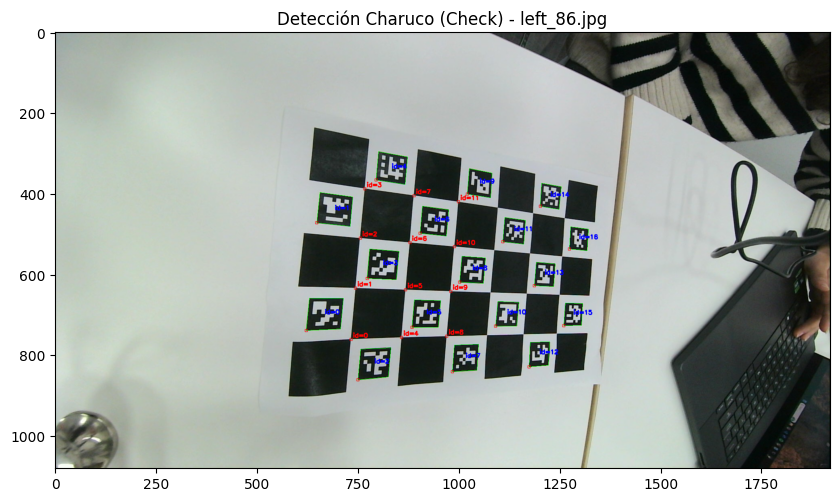

processing datospropios\calib\left_87.jpg and datospropios\calib\right_87.jpg
processing datospropios\calib\left_88.jpg and datospropios\calib\right_88.jpg
processing datospropios\calib\left_89.jpg and datospropios\calib\right_89.jpg
processing datospropios\calib\left_90.jpg and datospropios\calib\right_90.jpg
processing datospropios\calib\left_91.jpg and datospropios\calib\right_91.jpg
--- Visualizando Detección para datospropios\calib\left_91.jpg ---


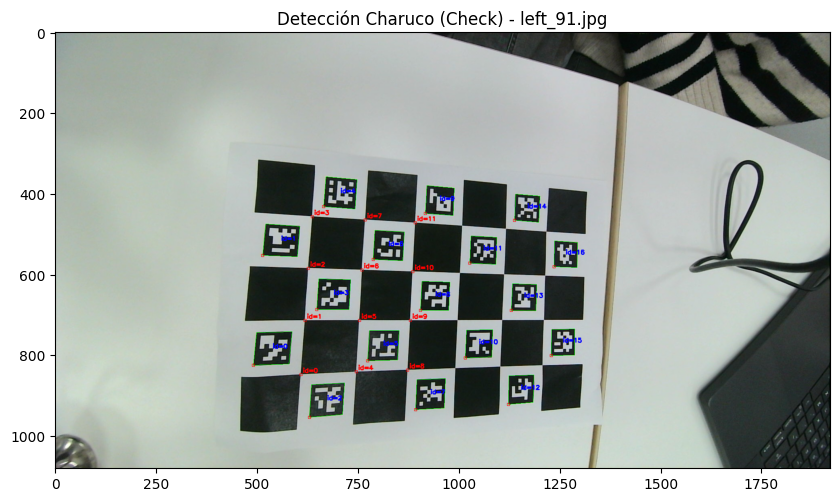

processing datospropios\calib\left_92.jpg and datospropios\calib\right_92.jpg
processing datospropios\calib\left_93.jpg and datospropios\calib\right_93.jpg
processing datospropios\calib\left_94.jpg and datospropios\calib\right_94.jpg
processing datospropios\calib\left_95.jpg and datospropios\calib\right_95.jpg
processing datospropios\calib\left_96.jpg and datospropios\calib\right_96.jpg
--- Visualizando Detección para datospropios\calib\left_96.jpg ---


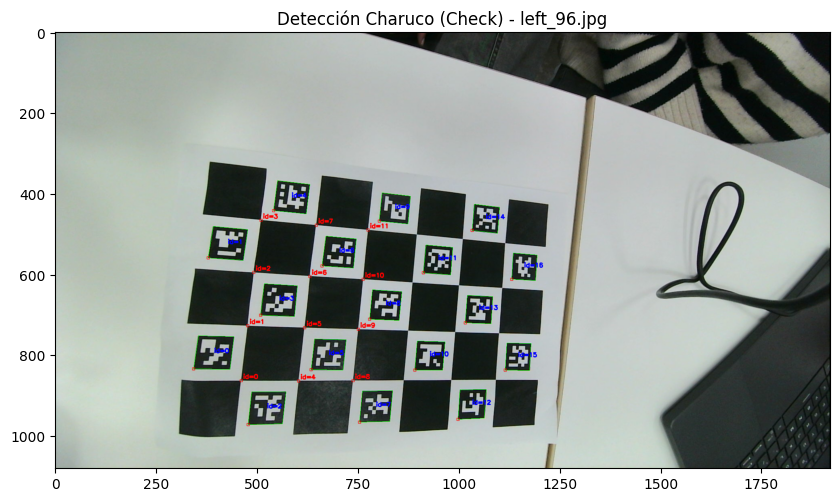

processing datospropios\calib\left_97.jpg and datospropios\calib\right_97.jpg
processing datospropios\calib\left_98.jpg and datospropios\calib\right_98.jpg
processing datospropios\calib\left_99.jpg and datospropios\calib\right_99.jpg
processing datospropios\calib\left_100.jpg and datospropios\calib\right_100.jpg
processing datospropios\calib\left_101.jpg and datospropios\calib\right_101.jpg
--- Visualizando Detección para datospropios\calib\left_101.jpg ---


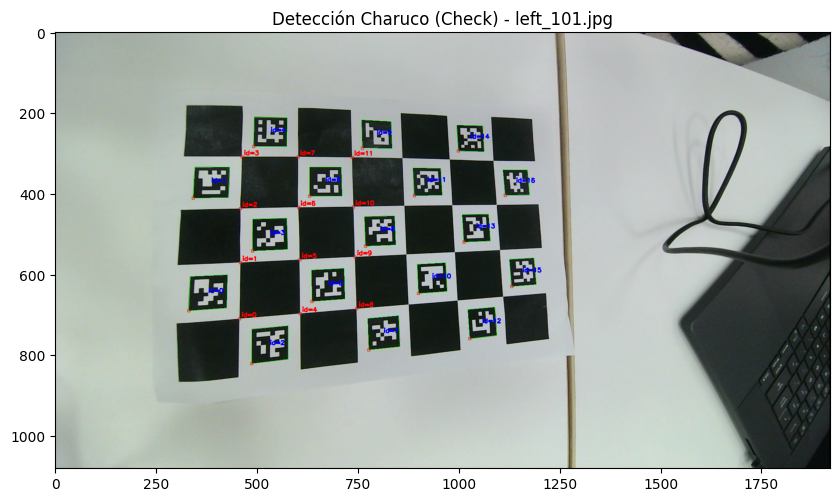

processing datospropios\calib\left_102.jpg and datospropios\calib\right_102.jpg
processing datospropios\calib\left_103.jpg and datospropios\calib\right_103.jpg
processing datospropios\calib\left_104.jpg and datospropios\calib\right_104.jpg
processing datospropios\calib\left_105.jpg and datospropios\calib\right_105.jpg
processing datospropios\calib\left_106.jpg and datospropios\calib\right_106.jpg
--- Visualizando Detección para datospropios\calib\left_106.jpg ---


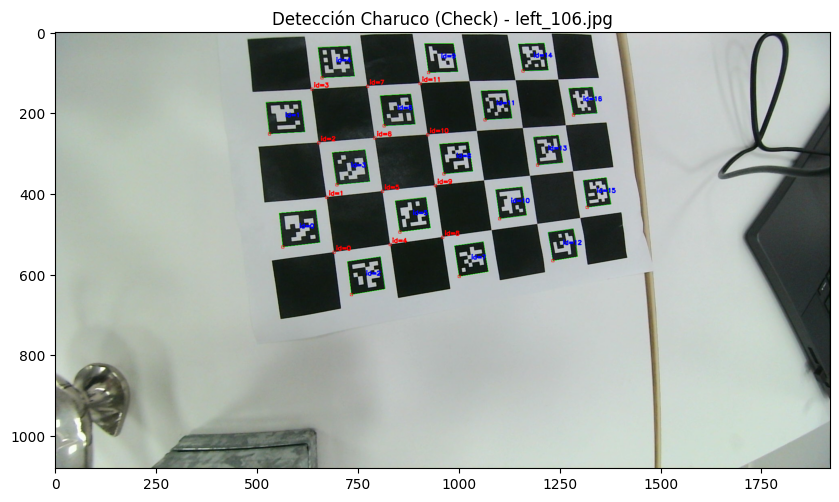

processing datospropios\calib\left_107.jpg and datospropios\calib\right_107.jpg
processing datospropios\calib\left_108.jpg and datospropios\calib\right_108.jpg
processing datospropios\calib\left_109.jpg and datospropios\calib\right_109.jpg
processing datospropios\calib\left_110.jpg and datospropios\calib\right_110.jpg
processing datospropios\calib\left_111.jpg and datospropios\calib\right_111.jpg
--- Visualizando Detección para datospropios\calib\left_111.jpg ---


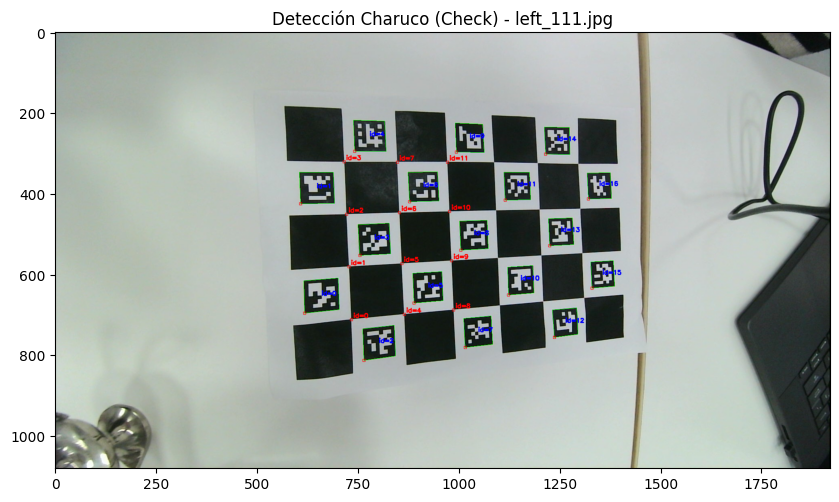

processing datospropios\calib\left_112.jpg and datospropios\calib\right_112.jpg
processing datospropios\calib\left_113.jpg and datospropios\calib\right_113.jpg
processing datospropios\calib\left_114.jpg and datospropios\calib\right_114.jpg
processing datospropios\calib\left_115.jpg and datospropios\calib\right_115.jpg
processing datospropios\calib\left_116.jpg and datospropios\calib\right_116.jpg
--- Visualizando Detección para datospropios\calib\left_116.jpg ---


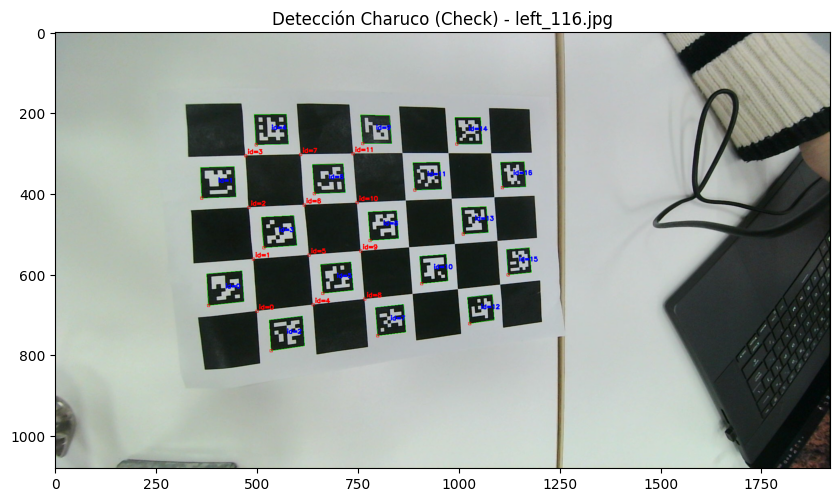

processing datospropios\calib\left_117.jpg and datospropios\calib\right_117.jpg

Procesamiento finalizado. Se recolectaron 117 pares de imágenes válidas.


In [66]:
#### TP2 Reconstruccion 3D
# ... (imports y definición de CharucoBoard) ...

# 1. Parámetros de la tabla (los que funcionaron)
checkerboard_size = (5, 4)
square_size = 0.022
marker_size = 0.0165
dictionary = aruco.getPredefinedDictionary(aruco.DICT_6X6_250)
board_charuco = aruco.CharucoBoard(
    size=checkerboard_size,
    squareLength=square_size,
    markerLength=marker_size,
    dictionary=dictionary
)

# ... (definición de directorios y función numeric_sort) ...

left_file_names = sorted(
    glob.glob(
        os.path.join(directory, left_files_pattern)
    ),
    key=numeric_sort
)
right_file_names = sorted(
    glob.glob(
        os.path.join(directory, right_files_pattern)
    ),
    key=numeric_sort
)

# Inicialización de variables de recolección
image_size = None
world_points = []
left_images = []
right_images = []
left_images_points = []
right_images_points = []

# Variables para la visualización de prueba
PLOT_FREQUENCY = 5 
plot_counter = 0

for left_file_name, right_file_name in zip(left_file_names, right_file_names):

    print(f"processing {left_file_name} and {right_file_name}")

    # leer imágenes
    left_image = cv2.imread(left_file_name, cv2.IMREAD_GRAYSCALE)
    right_image = cv2.imread(right_file_name, cv2.IMREAD_GRAYSCALE)
    left_image_color = cv2.imread(left_file_name) # Cargar a color para dibujar

    # ... (chequeo de tamaños de imagen, igual que antes) ...
    left_size = (left_image.shape[1], left_image.shape[0])
    right_size = (right_image.shape[1], right_image.shape[0])

    if left_size != right_size:
        raise Exception(f"left and right images sizes differ: {left_size} / {right_size}")
        
    if image_size is None:
        image_size = left_size
    else:
        if image_size != left_size:
            raise Exception(f"there are images with different sizes: {image_size} vs {left_size}")

    # --- Detectar y Recolectar Puntos ---
    
    # 1. Detectar ArUco
    corners_left, ids_left, _ = aruco.detectMarkers(left_image, dictionary)
    corners_right, ids_right, _ = aruco.detectMarkers(right_image, dictionary)

    # 2. Interpolar esquinas Charuco
    retval_left, charuco_corners_left, charuco_ids_left = aruco.interpolateCornersCharuco(
        markerCorners=corners_left,
        markerIds=ids_left,
        image=left_image,
        board=board_charuco
    )
    retval_right, charuco_corners_right, charuco_ids_right = aruco.interpolateCornersCharuco(
        markerCorners=corners_right,
        markerIds=ids_right,
        image=right_image,
        board=board_charuco
    )

    # 3. Chequear y Descartar
    if charuco_corners_left is None or charuco_corners_right is None or len(charuco_corners_left) < 4:
        print("warning, not enough charuco corners detected in left image.")
        continue

    # Obtener las coordenadas 3D (World Points)
    all_world_corners = board_charuco.getChessboardCorners()

    world_pts_left = all_world_corners[charuco_ids_left.flatten()]
    world_pts_right = all_world_corners[charuco_ids_right.flatten()]

    # 4. Intersección de IDs (Puntos Comunes)
    common_ids, left_idx, right_idx = np.intersect1d(
        charuco_ids_left.flatten(),
        charuco_ids_right.flatten(),
        return_indices=True
    )

    if len(common_ids) < 4:
        print("warning, not enough common corners between left and right. Pair discarded.")
        continue

    # 5. Guardar Puntos Válidos
    left_images.append(left_image)
    right_images.append(right_image)
    left_images_points.append(charuco_corners_left[left_idx])
    right_images_points.append(charuco_corners_right[right_idx])
    world_points.append(all_world_corners[common_ids]) # ¡Corregido!


    # --- VERIFICACIÓN Y VISUALIZACIÓN DE PRUEBA ---
    if plot_counter % PLOT_FREQUENCY == 0:
        print(f"--- Visualizando Detección para {left_file_name} ---")
        
        # Dibuja las esquinas Charuco (Puntos Azules)
        img_charuco = left_image_color.copy()
        aruco.drawDetectedCornersCharuco(
            image=img_charuco, 
            charucoCorners=charuco_corners_left, 
            charucoIds=charuco_ids_left,
            cornerColor=(0, 0, 255) # Azul
        )
        # Dibuja los ArUco (Verde)
        aruco.drawDetectedMarkers(
            image=img_charuco, 
            corners=corners_left, 
            ids=ids_left, 
            borderColor=(0, 255, 0) # Verde
        )

        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(img_charuco, cv2.COLOR_BGR2RGB))
        plt.title(f"Detección Charuco (Check) - {os.path.basename(left_file_name)}")
        plt.show()

    plot_counter += 1

# ... (El código de calibración estéreo vendría aquí, después del loop) ...
print(f"\nProcesamiento finalizado. Se recolectaron {len(world_points)} pares de imágenes válidas.")

es muy puto no funciona

bueno ahora fingo demencia y veo como seguiria si funcionara me estallo si tueviese emojis pondria el que se rie 


In [67]:
# Calibramos Stereo

print("Calibrating Stereo")
print("num images:", len(left_images_points))

err, left_K, left_dist, right_K, right_dist, R, T, E, F = cv2.stereoCalibrate(
    world_points, 
    left_images_points, 
    right_images_points, 
    None, 
    None, 
    None, 
    None, 
    image_size, 
    flags=0
)

Calibrating Stereo
num images: 117


In [68]:
from calib import np_print

to_print = [

    "# Left camera Intrinsics:",
    ("left_K", left_K),
    ("left_dist", left_dist),

    "# Right camera Intrinsics:",
    ("right_K", right_K),
    ("right_dist", right_dist),

    "# Rotation:",
    ("R", R),

    "# Translation:",
    ("T", T),
    
    "# Essential Matrix:",
    ("E", E),
    
    "# Fundamental Matrix:",
    ("F", F),
        
]

In [69]:
print("# STEREO CALIBRATION")
for line in to_print:

    if isinstance(line, str):   
        print(line)
    else:
        var_name, np_array = line
        print(f"{var_name} = {np_print(np_array)}\n")

# STEREO CALIBRATION
# Left camera Intrinsics:
left_K = np.array([
	[   592.192,	     0.000,	   962.750],
	[     0.000,	   593.137,	   527.172],
	[     0.000,	     0.000,	     1.000]
])

left_dist = np.array([
	[  0.000957,	 -0.007452,	  0.000772,	  0.000533,	 -0.002391]
])

# Right camera Intrinsics:
right_K = np.array([
	[   617.824,	     0.000,	   967.678],
	[     0.000,	   615.554,	   554.512],
	[     0.000,	     0.000,	     1.000]
])

right_dist = np.array([
	[  0.045490,	 -0.052691,	  0.003379,	  0.005179,	  0.011287]
])

# Rotation:
R = np.array([
	[     1.000,	    -0.003,	     0.011],
	[     0.003,	     1.000,	    -0.012],
	[    -0.011,	     0.012,	     1.000]
])

# Translation:
T = np.array([
	[ -0.036967],
	[ -0.002199],
	[  0.004473]
])

# Essential Matrix:
E = np.array([
	[     0.000,	    -0.004,	    -0.002],
	[     0.004,	     0.000,	     0.037],
	[     0.002,	    -0.037,	     0.000]
])

# Fundamental Matrix:
F = np.array([
	[    -0.000,	     0.000,	    -0.100],
	[    -0.0

In [71]:
# serializamos los resultados en un pickle
import pickle

calibration_results = {
    'left_K': left_K,
    'left_dist': left_dist,
    'right_K': right_K,
    'right_dist': right_dist,
    'R': R,
    'T': T,
    'E': E,
    'F': F,
    'image_size': image_size,
}

calibration_file = os.path.join("datospropios", "stereo_calibration.pkl")
with open(calibration_file, "wb") as f:
    f.write(pickle.dumps(calibration_results))
        


In [72]:
# para recuperar los resultados podemos cargarlos usando pickle:

with open(calibration_file, "rb") as f:
    results2 = pickle.loads(f.read())

In [73]:
results2.keys()

dict_keys(['left_K', 'left_dist', 'right_K', 'right_dist', 'R', 'T', 'E', 'F', 'image_size'])

### Rectificacion Estereo

In [74]:
# realicemos la rectificación estéreo:

R1, R2, P1, P2, Q, validRoi1, validRoi2 = cv2.stereoRectify(
    left_K, left_dist, right_K, right_dist, image_size, R, T, alpha=0
)


### Mapas de recitificacion

In [75]:
# calculemos los mapas de des-distorsión-rectificación:

left_map_x, left_map_y = cv2.initUndistortRectifyMap(left_K, left_dist, R1, P1, image_size, cv2.CV_32FC1)
right_map_x, right_map_y = cv2.initUndistortRectifyMap(right_K, right_dist, R2, P2, image_size, cv2.CV_32FC1)

In [ ]:
#chequeo que coincida con el image size
left_map_x.shape



(1080, 1920)

In [81]:
right_map_x.shape


(1080, 1920)

In [82]:
#imagen random para verificar
image_index = 22
left_image = left_images[image_index]
right_image = right_images[image_index]
left_image.shape


(1080, 1920)

In [83]:
right_image.shape

(1080, 1920)

vampoooooooooooo


### Remap

esto que esta aca es un file de git de ellos que no me deja acceder como pip entoncces lo copio aca

In [87]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


def prepare_plot_args(image, cmap=None):
    """Prepare the arguments for imshow based on the image type and optional colormap."""
    if len(image.shape) == 2:  # Grayscale image
        cmap = cmap or 'gray'  # Use provided colormap or default to 'gray'
        vmin, vmax = (0, 255) if image.dtype == np.uint8 else (None, None)
        return image, {'cmap': cmap, 'vmin': vmin, 'vmax': vmax}
    else:  # Color image (assumes BGR)
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB), {}


def display_image(ax, image, title=None, cmap=None):
    """Display an image on a matplotlib axis with an optional colormap."""
    img_data, plot_args = prepare_plot_args(image, cmap)
    ax.imshow(img_data, **plot_args)
    ax.axis('off')
    if title:
        ax.set_title(title, fontsize=10)


def imshow(image, title=None, figsize=None, show=True, cmap=None):
    """Plot an image using matplotlib with an optional colormap."""
    args = {}
    if figsize is not None:
        args = {"figsize": figsize}
    fig, ax = plt.subplots(**args)
    display_image(ax, image, title, cmap)
    if show:
        plt.show()
        return None
    else:
        return fig, ax


def show_images(images, titles=None, grid=None, figsize=None, title=None, subtitle=None, show=True, colormaps=None):
    """Display multiple images in a grid with optional colormaps."""
    if grid is None:
        grid = (1, len(images))

    if titles is None:
        titles = [None] * len(images)

    # Handle colormaps: if a single colormap is provided, use it for all images
    if colormaps is not None:
        if isinstance(colormaps, str):
            colormaps = [colormaps] * len(images)
        elif len(colormaps) != len(images):
            raise ValueError("Length of colormaps must match the number of images.")
    else:
        colormaps = [None] * len(images)

    n_rows, n_cols = grid
    if figsize is None:
        w = 10
        h = int(1.2 * n_rows * w / n_cols)
        figsize = (w, h)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)

    if isinstance(axes, np.ndarray):
        axes = axes.flat
    else:
        axes = [axes]

    for i, ax in enumerate(axes):
        if i < len(images):
            display_image(ax, images[i], titles[i], colormaps[i])
        else:
            ax.axis('off')

    if title:
        fig.text(0.5, 1, title, ha='center', fontsize=12)

    if subtitle:
        fig.text(0.5, 0, subtitle, ha='center', fontsize=12)

    plt.tight_layout()

    if show:
        plt.show()
        return None
    return fig, axes

In [84]:
#tomo un par stereo random
# tomemos un par estéreo
image_index = 22

left_image = left_images[image_index]
right_image = right_images[image_index]

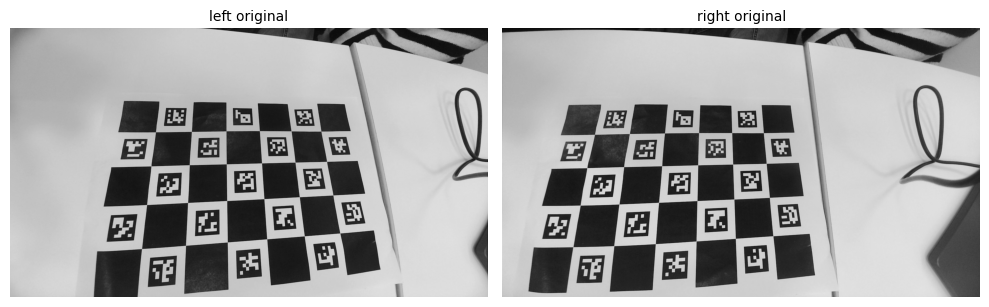

In [88]:
# muestro las imagenes:
show_images([
    left_image, right_image
], [
    "left original", "right original"
])


In [89]:
# aplicamos des-distorsion + rectificación, con los mapas que calculamos ateriormente
left_image_rectified = cv2.remap(left_image, left_map_x, left_map_y, cv2.INTER_LINEAR)
right_image_rectified = cv2.remap(right_image, right_map_x, right_map_y, cv2.INTER_LINEAR)

In [90]:
import numpy as np

# Ejemplo, para saber qué valor poner en la posición (i,j) de la imagen destino,
# a cuál píxel en la imagen original tendríamos que ir buscar?
x_dest, y_dest = 321, 123

x_ori = left_map_x[y_dest, x_dest]
y_ori = left_map_y[y_dest, x_dest]

x_ori = int(np.round(x_ori))
y_ori = int(np.round(y_ori))

print(f"using nearest neighbor interpolation, I_dest[{y_dest}, {x_dest}] = I_ori[{y_ori}, {x_ori}]")

print(left_image[y_ori, x_ori])
print(left_image_rectified[y_dest, x_dest])


using nearest neighbor interpolation, I_dest[123, 321] = I_ori[243, 465]
188
188


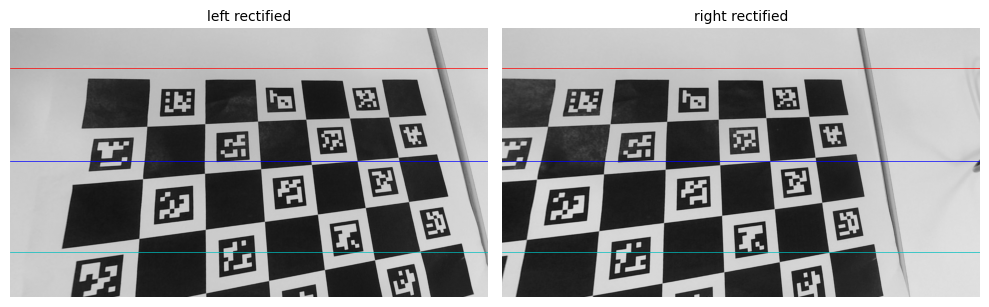

In [91]:
# muestro las imagenes stereo-rectificadas
# observar el vertice de la caja, de la notebook, y del cuaderno. 
# coinciden perfectamente en y.
from matplotlib import pyplot as plt 

fig, axes = show_images([
    left_image_rectified, right_image_rectified
], [
    "left rectified", "right rectified"
], show=False)

for y, c in zip([160, 533, 900], ['r', 'b', 'c']):
    axes[0].axhline(y=y, color=c, linestyle='-', linewidth=0.5)
    axes[1].axhline(y=y, color=c, linestyle='-', linewidth=0.5)
plt.show()

In [94]:
# Guardemos los resultados de rectificación para usar posteriormente:

stereo_maps = {

    # undistorting maps
    "left_map_x": left_map_x,
    "left_map_y": left_map_y,
    "right_map_x": right_map_x,
    "right_map_y": right_map_y,

    # add also rectifying info:
    "R1": R1,
    "R2": R2,
    "P1": P1,
    "P2": P2,
    "Q": Q,
    "validRoi1": validRoi1,
    "validRoi2": validRoi2,

}

stereo_maps_file = os.path.join("datospropios", "stereo_maps.pkl")
with open(stereo_maps_file, "wb") as f:
    f.write(pickle.dumps(stereo_maps))
        

### Tool calibracion estereo

faalta terminar me dio paja